In [2]:
# Only this single line is needed
!pip install -q efficientnet_pytorch


  Preparing metadata (setup.py) ... done


In [3]:
import os
import io
import json
import glob
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, roc_curve, precision_recall_curve,
    average_precision_score, brier_score_loss, confusion_matrix
)
from sklearn.calibration import calibration_curve
from tqdm.auto import tqdm
from efficientnet_pytorch import EfficientNet

# =====================================================================
# GLOBAL CONFIGURATION
# =====================================================================
FAKE_CLASS_INDEX = 0   # 0 = Fake, 1 = Real in model output head

# =====================================================================
# 1. MODEL ARCHITECTURE (EfficientNet-B4 + CBAM)
# =====================================================================

class ChannelAttention(nn.Module):
    def __init__(self, in_planes, ratio=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.fc1 = nn.Conv2d(in_planes, in_planes // ratio, 1, bias=False)
        self.relu1 = nn.ReLU(inplace=True)
        self.fc2 = nn.Conv2d(in_planes // ratio, in_planes, 1, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc2(self.relu1(self.fc1(self.avg_pool(x))))
        max_out = self.fc2(self.relu1(self.fc1(self.max_pool(x))))
        return self.sigmoid(avg_out + max_out)


class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super().__init__()
        padding = 3 if kernel_size == 7 else 1
        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        return self.sigmoid(self.conv1(torch.cat([avg_out, max_out], dim=1)))


class CBAM(nn.Module):
    def __init__(self, in_planes, ratio=16, kernel_size=7):
        super().__init__()
        self.ca = ChannelAttention(in_planes, ratio)
        self.sa = SpatialAttention(kernel_size)

    def forward(self, x):
        x = x * self.ca(x)
        x = x * self.sa(x)
        return x


class ImprovedContrastiveFeatureExtractor(nn.Module):
    def __init__(self):
        super().__init__()
        self.efficient_net = EfficientNet.from_pretrained('efficientnet-b4')
        self.cbam = CBAM(1792)
        self.classifier = nn.Linear(1792, 2)
        self.dropout = nn.Dropout(p=0.5)

    def forward(self, x):
        x = self.efficient_net.extract_features(x)
        x = self.cbam(x)
        x = self.efficient_net._avg_pooling(x)
        x = x.flatten(start_dim=1)
        x = self.dropout(x)
        return self.classifier(x)


# =====================================================================
# 2. PYTORCH IMAGE DATASET
# =====================================================================

class FaceImageDataset(Dataset):
    def __init__(self, sample_list, transform=None):
        self.sample_list = sample_list  # [(image_path, label)]
        self.transform = transform

    def __len__(self):
        return len(self.sample_list)

    def __getitem__(self, idx):
        path, label = self.sample_list[idx]
        img = Image.open(path).convert('RGB')
        if self.transform:
            tensor = self.transform(img)
        else:
            tensor = transforms.ToTensor()(img)
        return tensor, label, path


# =====================================================================
# 3. EXPLAINABLE AI ENGINE (Grad-CAM, CBAM, 2D FFT)
# =====================================================================

class XAIEngine:
    def __init__(self, model, device):
        self.model = model
        self.device = device
        self.activations = None
        self.gradients = None

    def _hook_tensor(self, grad):
        self.gradients = grad

    def generate_xai_package(self, pil_img, transform):
        tensor = transform(pil_img).unsqueeze(0).to(self.device)
        tensor.requires_grad = True

        self.model.eval()
        self.model.zero_grad()

        features = self.model.efficient_net.extract_features(tensor)
        cbam_out = self.model.cbam(features)
        
        self.activations = cbam_out
        cbam_out.register_hook(self._hook_tensor)

        pooled = self.model.efficient_net._avg_pooling(cbam_out)
        flat = pooled.flatten(start_dim=1)
        dropped = self.model.dropout(flat)
        logits = self.model.classifier(dropped)

        prob_fake = F.softmax(logits, dim=1)[:, FAKE_CLASS_INDEX].item()

        # Backward target score for Fake
        target_score = logits[0, FAKE_CLASS_INDEX]
        target_score.backward()

        # 1. Grad-CAM
        weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)
        grad_cam = torch.sum(weights * self.activations, dim=1, keepdim=True)
        grad_cam = F.relu(grad_cam)
        grad_cam = F.interpolate(grad_cam, size=(380, 380), mode='bilinear', align_corners=False)
        grad_cam = grad_cam.squeeze().detach().cpu().numpy()
        if grad_cam.max() > grad_cam.min():
            grad_cam = (grad_cam - grad_cam.min()) / (grad_cam.max() - grad_cam.min())

        # 2. CBAM Spatial Attention Map
        with torch.no_grad():
            avg_out = torch.mean(features, dim=1, keepdim=True)
            max_out, _ = torch.max(features, dim=1, keepdim=True)
            cbam_map = self.model.cbam.sa.sigmoid(self.model.cbam.sa.conv1(torch.cat([avg_out, max_out], dim=1)))
            cbam_map = F.interpolate(cbam_map, size=(380, 380), mode='bilinear', align_corners=False)
            cbam_map = cbam_map.squeeze().cpu().numpy()

        # 3. 2D FFT Frequency Analysis
        gray = np.array(pil_img.resize((380, 380)).convert('L'))
        f_transform = np.fft.fft2(gray)
        f_shift = np.fft.fftshift(f_transform)
        magnitude_spectrum = 20 * np.log(np.abs(f_shift) + 1e-9)

        self.gradients = None
        self.activations = None
        torch.cuda.empty_cache()

        return {
            "pil_img": pil_img.resize((380, 380)),
            "cbam_map": cbam_map,
            "grad_cam": grad_cam,
            "fft": magnitude_spectrum,
            "prob_fake": prob_fake
        }


# =====================================================================
# 4. PERTURBATION HELPERS
# =====================================================================

def perturb_jpeg(pil_img, quality):
    buf = io.BytesIO()
    pil_img.save(buf, format='JPEG', quality=quality)
    buf.seek(0)
    return Image.open(buf).convert('RGB')

def perturb_blur(pil_img, ksize):
    import cv2
    if ksize <= 1:
        return pil_img
    arr = np.array(pil_img)
    k = ksize if ksize % 2 != 0 else ksize + 1
    blurred = cv2.GaussianBlur(arr, (k, k), 0)
    return Image.fromarray(blurred)

def perturb_downscale(pil_img, factor):
    if factor <= 1:
        return pil_img
    w, h = pil_img.size
    down = pil_img.resize((max(8, w // factor), max(8, h // factor)), Image.BILINEAR)
    return down.resize((w, h), Image.BILINEAR)


# =====================================================================
# 5. MASTER 140K EVALUATION PIPELINE
# =====================================================================

def run_140k_benchmark(
    weights_path,
    dataset_root="/kaggle/input/datasets/xhlulu/140k-real-and-fake-faces",
    output_dir="./benchmark_artifacts_140k",
    max_samples_per_class=None,     # Set to e.g. 1000 for quick test, or None for all 20,000
    batch_size=64,
    run_robustness_test=True
):
    os.makedirs(output_dir, exist_ok=True)
    DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"[*] Evaluation Device: {DEVICE}")

    # 1. Load Model
    model = ImprovedContrastiveFeatureExtractor()
    if not os.path.exists(weights_path):
        raise FileNotFoundError(f"Weights file not found at: {weights_path}")

    print(f"[*] Loading model weights from: {weights_path}")
    ckpt = torch.load(weights_path, map_location=DEVICE, weights_only=False)
    state_dict = ckpt['model'] if isinstance(ckpt, dict) and 'model' in ckpt else ckpt
    model.load_state_dict(state_dict, strict=False)
    model.to(DEVICE)
    model.eval()

    transform = transforms.Compose([
        transforms.Resize((380, 380)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    xai = XAIEngine(model, DEVICE)

    # 2. Locate Test Folders
    # The dataset has structure: .../real_vs_fake/real-vs-fake/test/real and .../test/fake
    candidate_test_dirs = [
        os.path.join(dataset_root, "real_vs_fake", "real-vs-fake", "test"),
        os.path.join(dataset_root, "real-vs-fake", "test"),
        os.path.join(dataset_root, "test")
    ]
    test_dir = None
    for cand in candidate_test_dirs:
        if os.path.exists(cand):
            test_dir = cand
            break

    if test_dir is None:
        raise FileNotFoundError(f"Could not locate 'test' directory inside: {dataset_root}")

    real_folder = os.path.join(test_dir, "real")
    fake_folder = os.path.join(test_dir, "fake")

    print(f"[*] Located Test Directory: {test_dir}")
    print(f"[*] Real folder: {real_folder}")
    print(f"[*] Fake folder: {fake_folder}")

    valid_exts = ('.jpg', '.jpeg', '.png', '.webp')
    real_files = [os.path.join(real_folder, f) for f in os.listdir(real_folder) if f.lower().endswith(valid_exts)]
    fake_files = [os.path.join(fake_folder, f) for f in os.listdir(fake_folder) if f.lower().endswith(valid_exts)]

    if max_samples_per_class:
        real_files = real_files[:max_samples_per_class]
        fake_files = fake_files[:max_samples_per_class]

    # Label: Real = 0, Fake = 1
    samples = [(p, 0) for p in real_files] + [(p, 1) for p in fake_files]
    print(f"[*] Total Test Images: {len(samples)} (Real: {len(real_files)}, Fake: {len(fake_files)})")

    dataset = FaceImageDataset(samples, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

    # 3. High-Speed Batch Inference
    y_true = []
    y_pred_probs = []
    all_paths = []

    print("[*] Running batch evaluation...")
    with torch.no_grad():
        for batch_tensors, batch_labels, batch_paths in tqdm(dataloader, desc="Evaluating Batches"):
            batch_tensors = batch_tensors.to(DEVICE)
            logits = model(batch_tensors)
            
            # Probability for Fake class
            probs_fake = F.softmax(logits, dim=1)[:, FAKE_CLASS_INDEX].cpu().numpy()

            y_true.extend(batch_labels.numpy())
            y_pred_probs.extend(probs_fake)
            all_paths.extend(batch_paths)

    y_true = np.array(y_true)
    y_pred_probs = np.array(y_pred_probs)
    y_pred = (y_pred_probs > 0.5).astype(int)

    # 4. Save Predictions CSV
    pred_df = pd.DataFrame({
        "image_path": all_paths,
        "true_label": y_true,
        "predicted_prob_fake": y_pred_probs,
        "predicted_label": y_pred
    })
    csv_out = os.path.join(output_dir, "predictions_140k.csv")
    pred_df.to_csv(csv_out, index=False)
    print(f"[+] Saved individual predictions to: {csv_out}")

    # 5. Compute Metrics
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    auc = roc_auc_score(y_true, y_pred_probs)
    ap = average_precision_score(y_true, y_pred_probs)
    brier = brier_score_loss(y_true, y_pred_probs)

    # Equal Error Rate (EER)
    fpr, tpr, roc_thresholds = roc_curve(y_true, y_pred_probs, pos_label=1)
    fnr = 1.0 - tpr
    eer_idx = np.nanargmin(np.abs(fpr - fnr))
    eer = float((fpr[eer_idx] + fnr[eer_idx]) / 2.0)
    eer_thresh = float(roc_thresholds[eer_idx])

    # FPR at fixed TPR
    fpr_95 = float(np.interp(0.95, tpr, fpr)) if np.max(tpr) >= 0.95 else 0.0
    fpr_99 = float(np.interp(0.99, tpr, fpr)) if np.max(tpr) >= 0.99 else 0.0

    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0

    # Summary JSON
    summary = {
        "Dataset": "140k Real and Fake Faces (xhlulu)",
        "Total_Images": len(y_true),
        "Real_Count": int(np.sum(y_true == 0)),
        "Fake_Count": int(np.sum(y_true == 1)),
        "Accuracy": float(acc),
        "Precision": float(prec),
        "Recall_TPR": float(rec),
        "Specificity_TNR": float(specificity),
        "F1_Score": float(f1),
        "ROC_AUC": float(auc),
        "Average_Precision": float(ap),
        "Equal_Error_Rate": float(eer),
        "EER_Threshold": float(eer_thresh),
        "Brier_Score": float(brier),
        "FPR_at_95_TPR": float(fpr_95),
        "FPR_at_99_TPR": float(fpr_99),
        "Confusion_Matrix": {"TN": int(tn), "FP": int(fp), "FN": int(fn), "TP": int(tp)}
    }
    with open(os.path.join(output_dir, "metrics_summary_140k.json"), "w") as jf:
        json.dump(summary, jf, indent=4)

    # Terminal Report
    print("\n" + "=" * 55)
    print("   140K REAL & FAKE FACES BENCHMARK RESULTS")
    print("=" * 55)
    print(f"Total Evaluated Images:      {len(y_true)} (Real: {np.sum(y_true == 0)}, Fake: {np.sum(y_true == 1)})")
    print(f"Accuracy:                    {acc * 100:.2f}%")
    print(f"Precision:                   {prec * 100:.2f}%")
    print(f"Recall (Sensitivity / TPR):  {rec * 100:.2f}%")
    print(f"Specificity (True Neg Rate): {specificity * 100:.2f}%")
    print(f"F1-Score:                    {f1 * 100:.2f}%")
    print(f"ROC-AUC:                     {auc:.4f}")
    print(f"Average Precision (AP):      {ap:.4f}")
    print(f"Equal Error Rate (EER):      {eer * 100:.2f}% (Threshold: {eer_thresh:.4f})")
    print(f"Brier Calibration Score:     {brier:.4f}")
    print(f"FPR @ 95% TPR:               {fpr_95 * 100:.2f}%")
    print(f"FPR @ 99% TPR:               {fpr_99 * 100:.2f}%")
    print("-" * 55)
    print(f"Confusion Matrix: [TN={tn}, FP={fp}, FN={fn}, TP={tp}]")
    print("=" * 55)

    # 6. Multi-Panel Diagnostic Plot
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    # ROC
    axes[0, 0].plot(fpr, tpr, color='#d90429', lw=2.2, label=f'ROC (AUC = {auc:.4f})')
    axes[0, 0].plot([0, 1], [0, 1], color='#8d99ae', linestyle='--')
    axes[0, 0].scatter([eer], [1 - eer], color='#111111', s=50, zorder=5, label=f'EER = {eer*100:.2f}%')
    axes[0, 0].set_title('ROC Curve & Equal Error Rate', fontsize=13, fontweight='bold')
    axes[0, 0].set_xlabel('False Positive Rate')
    axes[0, 0].set_ylabel('True Positive Rate')
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].legend(loc='lower right')

    # PR Curve
    prec_v, rec_v, _ = precision_recall_curve(y_true, y_pred_probs)
    axes[0, 1].plot(rec_v, prec_v, color='#0077b6', lw=2.2, label=f'PR (AP = {ap:.4f})')
    axes[0, 1].set_title('Precision-Recall Curve', fontsize=13, fontweight='bold')
    axes[0, 1].set_xlabel('Recall')
    axes[0, 1].set_ylabel('Precision')
    axes[0, 1].grid(True, alpha=0.3)
    axes[0, 1].legend(loc='lower left')

    # Calibration Reliability
    prob_true, prob_pred = calibration_curve(y_true, y_pred_probs, n_bins=10)
    axes[1, 0].plot(prob_pred, prob_true, marker='o', color='#fb8500', lw=2.2, label='Model')
    axes[1, 0].plot([0, 1], [0, 1], linestyle='--', color='#8d99ae', label='Perfect Calibration')
    axes[1, 0].set_title(f'Calibration Reliability (Brier: {brier:.4f})', fontsize=13, fontweight='bold')
    axes[1, 0].set_xlabel('Mean Predicted Probability')
    axes[1, 0].set_ylabel('Fraction of Positives')
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 0].legend(loc='upper left')

    # Confusion Matrix Heatmap
    cm_norm = cm.astype('float') / np.maximum(cm.sum(axis=1)[:, np.newaxis], 1)
    im = axes[1, 1].imshow(cm_norm, cmap='Blues', vmin=0, vmax=1)
    axes[1, 1].set_title('Normalized Confusion Matrix', fontsize=13, fontweight='bold')
    axes[1, 1].set_xticks([0, 1])
    axes[1, 1].set_yticks([0, 1])
    axes[1, 1].set_xticklabels(['Pred Real (0)', 'Pred Fake (1)'])
    axes[1, 1].set_yticklabels(['True Real (0)', 'True Fake (1)'])
    for i in range(2):
        for j in range(2):
            val_str = f"{cm[i, j]}\n({cm_norm[i, j]*100:.1f}%)"
            color = "white" if cm_norm[i, j] > 0.5 else "black"
            axes[1, 1].text(j, i, val_str, ha="center", va="center", color=color, fontweight='bold')
    fig.colorbar(im, ax=axes[1, 1], fraction=0.046, pad=0.04)

    plt.tight_layout()
    diag_plot_path = os.path.join(output_dir, "diagnostic_curves_140k.png")
    plt.savefig(diag_plot_path, dpi=300)
    plt.close()
    print(f"[+] Saved diagnostic curves to: {diag_plot_path}")

    # 7. Qualitative XAI Visualization (Samples of Real, Fake & Errors)
    print("[*] Generating XAI Explainability Visualizations...")
    samples_to_plot = []
    
    cr = np.where((y_true == 0) & (y_pred == 0))[0]
    cf = np.where((y_true == 1) & (y_pred == 1))[0]
    if len(cr) > 0:
        samples_to_plot.append((all_paths[cr[0]], "True Real (Correct)"))
    if len(cf) > 0:
        samples_to_plot.append((all_paths[cf[0]], "True Fake (Correct)"))

    # Top False Positive and False Negative
    errors = [(abs(y_true[i] - y_pred_probs[i]), i) for i in range(len(y_true))]
    errors.sort(reverse=True, key=lambda x: x[0])
    for _, idx in errors[:2]:
        name = "False Positive" if y_true[idx] == 0 else "False Negative"
        samples_to_plot.append((all_paths[idx], f"{name} (Failure Case)"))

    for img_p, title in samples_to_plot:
        pil_img = Image.open(img_p).convert('RGB')
        xai_data = xai.generate_xai_package(pil_img, transform)

        fig, ax = plt.subplots(1, 4, figsize=(16, 4))
        ax[0].imshow(xai_data['pil_img'])
        ax[0].set_title(f"{title}\nPred Fake: {xai_data['prob_fake']:.3f}", fontsize=11, fontweight='bold')
        ax[0].axis('off')

        ax[1].imshow(xai_data['pil_img'])
        ax[1].imshow(xai_data['cbam_map'], cmap='jet', alpha=0.5)
        ax[1].set_title("CBAM Spatial Attention", fontsize=11, fontweight='bold')
        ax[1].axis('off')

        ax[2].imshow(xai_data['pil_img'])
        ax[2].imshow(xai_data['grad_cam'], cmap='magma', alpha=0.5)
        ax[2].set_title("Grad-CAM Activation", fontsize=11, fontweight='bold')
        ax[2].axis('off')

        ax[3].imshow(xai_data['fft'], cmap='inferno')
        ax[3].set_title("2D FFT Spectrum", fontsize=11, fontweight='bold')
        ax[3].axis('off')

        fname = f"xai_{title.lower().split()[0]}_{title.lower().split()[1]}.png"
        plt.tight_layout()
        plt.savefig(os.path.join(output_dir, fname), dpi=250)
        plt.close()

    # 8. Robustness Stress-Testing (100 sample subset)
    if run_robustness_test:
        print("[*] Running Robustness Stress-Testing (JPEG, Blur, Downsampling)...")
        sub_samples = samples[:100]
        
        # JPEG
        jpeg_qualities = [100, 75, 50, 30, 15]
        jpeg_accs = []
        for q in jpeg_qualities:
            preds = []
            for p, lbl in sub_samples:
                img = Image.open(p).convert('RGB')
                pert = perturb_jpeg(img, q)
                t = transform(pert).unsqueeze(0).to(DEVICE)
                with torch.no_grad():
                    prob = F.softmax(model(t), dim=1)[:, FAKE_CLASS_INDEX].item()
                preds.append((prob > 0.5) == lbl)
            jpeg_accs.append(np.mean(preds) * 100)

        # Blur
        blur_kernels = [0, 3, 5, 7, 9]
        blur_accs = []
        for k in blur_kernels:
            preds = []
            for p, lbl in sub_samples:
                img = Image.open(p).convert('RGB')
                pert = perturb_blur(img, k)
                t = transform(pert).unsqueeze(0).to(DEVICE)
                with torch.no_grad():
                    prob = F.softmax(model(t), dim=1)[:, FAKE_CLASS_INDEX].item()
                preds.append((prob > 0.5) == lbl)
            blur_accs.append(np.mean(preds) * 100)

        # Downsample
        down_factors = [1, 2, 4, 6, 8]
        down_accs = []
        for f in down_factors:
            preds = []
            for p, lbl in sub_samples:
                img = Image.open(p).convert('RGB')
                pert = perturb_downscale(img, f)
                t = transform(pert).unsqueeze(0).to(DEVICE)
                with torch.no_grad():
                    prob = F.softmax(model(t), dim=1)[:, FAKE_CLASS_INDEX].item()
                preds.append((prob > 0.5) == lbl)
            down_accs.append(np.mean(preds) * 100)

        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        axes[0].plot(jpeg_qualities, jpeg_accs, marker='s', color='#7209b7', lw=2.2)
        axes[0].set_title('JPEG Robustness', fontsize=12, fontweight='bold')
        axes[0].set_xlabel('Quality Factor (Q)')
        axes[0].set_ylabel('Accuracy (%)')
        axes[0].grid(True, alpha=0.3)
        axes[0].invert_xaxis()

        axes[1].plot(blur_kernels, blur_accs, marker='o', color='#2a9d8f', lw=2.2)
        axes[1].set_title('Gaussian Blur Robustness', fontsize=12, fontweight='bold')
        axes[1].set_xlabel('Kernel Size (px)')
        axes[1].set_ylabel('Accuracy (%)')
        axes[1].grid(True, alpha=0.3)

        axes[2].plot(down_factors, down_accs, marker='^', color='#e76f51', lw=2.2)
        axes[2].set_title('Downsampling Robustness', fontsize=12, fontweight='bold')
        axes[2].set_xlabel('Downscaling Factor (x)')
        axes[2].set_ylabel('Accuracy (%)')
        axes[2].grid(True, alpha=0.3)

        plt.tight_layout()
        rob_out = os.path.join(output_dir, "robustness_triplet_140k.png")
        plt.savefig(rob_out, dpi=250)
        plt.close()
        print(f"[+] Saved robustness triplet plot to: {rob_out}")

    print(f"\n[SUCCESS] 140K Faces Benchmark finished! All outputs saved in: '{output_dir}'")


# =====================================================================
# 6. EXECUTION
# =====================================================================

if __name__ == "__main__":
    WEIGHTS_PATH = "/kaggle/input/models/sakshamagarwal123/deepfake/pytorch/default/1/improved_finetuned_model.pth"
    
    # Root path to 140k-real-and-fake-faces dataset
    DATASET_ROOT = "/kaggle/input/datasets/xhlulu/140k-real-and-fake-faces"
    OUTPUT_DIR = "/kaggle/working/benchmark_artifacts_140k"

    run_140k_benchmark(
        weights_path=WEIGHTS_PATH,
        dataset_root=DATASET_ROOT,
        output_dir=OUTPUT_DIR,
        max_samples_per_class=None,     # Set to e.g. 1000 for a quick 15-sec check, or None for all 20,000 test images
        batch_size=64,                  # Uses GPU batching for fast evaluation
        run_robustness_test=True
    )


[*] Evaluation Device: cuda
Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b4-6ed6700e.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b4-6ed6700e.pth


100%|██████████| 74.4M/74.4M [00:00<00:00, 281MB/s]


Loaded pretrained weights for efficientnet-b4
[*] Loading model weights from: /kaggle/input/models/sakshamagarwal123/deepfake/pytorch/default/1/improved_finetuned_model.pth
[*] Located Test Directory: /kaggle/input/datasets/xhlulu/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/test
[*] Real folder: /kaggle/input/datasets/xhlulu/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/test/real
[*] Fake folder: /kaggle/input/datasets/xhlulu/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/test/fake
[*] Total Test Images: 20000 (Real: 10000, Fake: 10000)
[*] Running batch evaluation...


Evaluating Batches:   0%|          | 0/313 [00:00<?, ?it/s]

[+] Saved individual predictions to: /kaggle/working/benchmark_artifacts_140k/predictions_140k.csv

   140K REAL & FAKE FACES BENCHMARK RESULTS
Total Evaluated Images:      20000 (Real: 10000, Fake: 10000)
Accuracy:                    99.95%
Precision:                   99.93%
Recall (Sensitivity / TPR):  99.98%
Specificity (True Neg Rate): 99.93%
F1-Score:                    99.96%
ROC-AUC:                     1.0000
Average Precision (AP):      1.0000
Equal Error Rate (EER):      0.02% (Threshold: 0.6132)
Brier Calibration Score:     0.0139
FPR @ 95% TPR:               0.01%
FPR @ 99% TPR:               0.01%
-------------------------------------------------------
Confusion Matrix: [TN=9993, FP=7, FN=2, TP=9998]
[+] Saved diagnostic curves to: /kaggle/working/benchmark_artifacts_140k/diagnostic_curves_140k.png
[*] Generating XAI Explainability Visualizations...
[*] Running Robustness Stress-Testing (JPEG, Blur, Downsampling)...
[+] Saved robustness triplet plot to: /kaggle/working/be

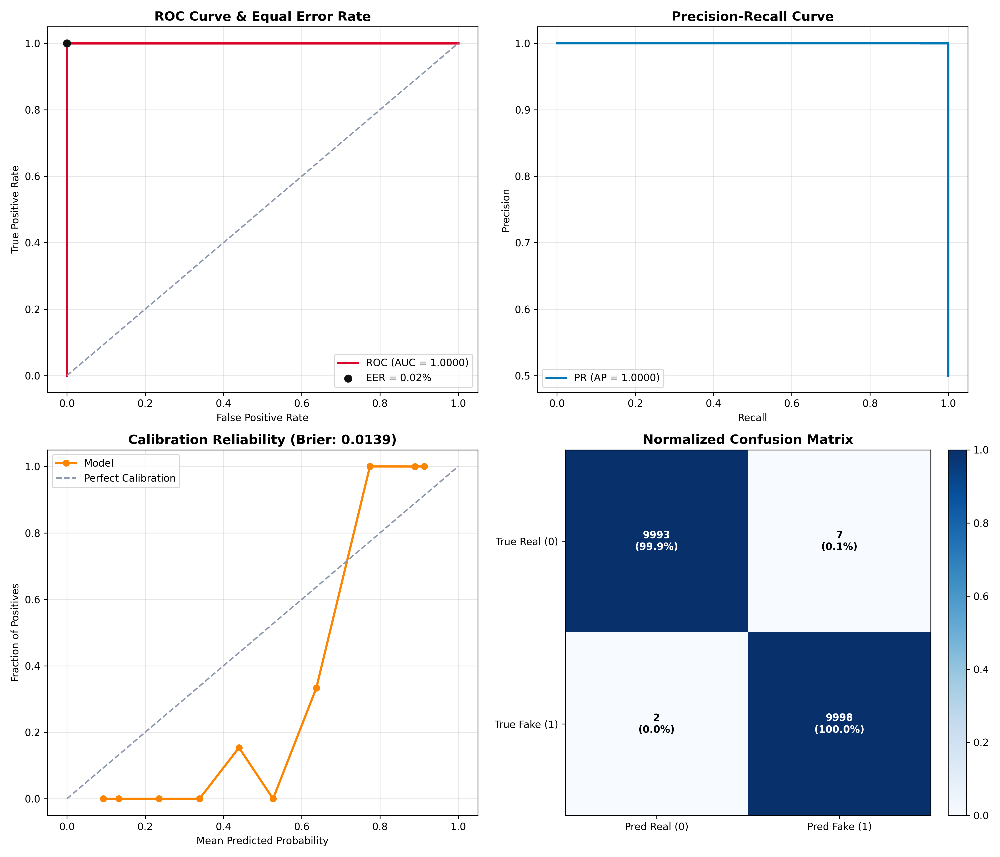

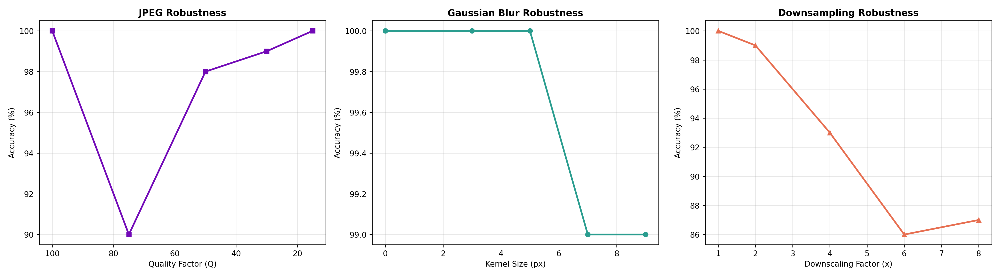

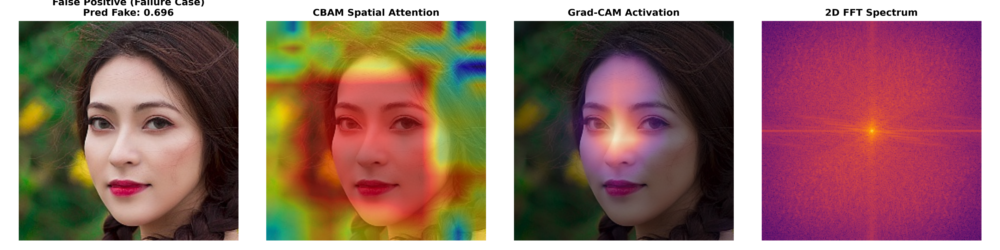

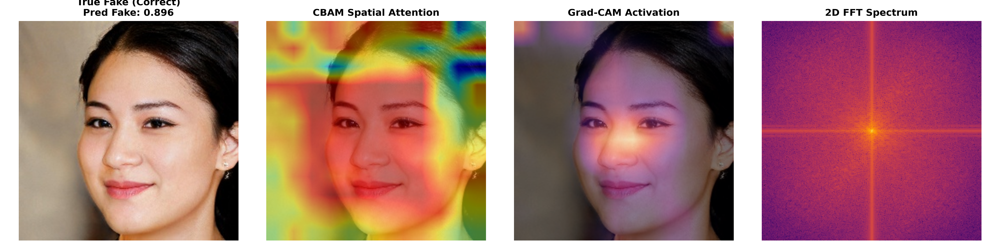

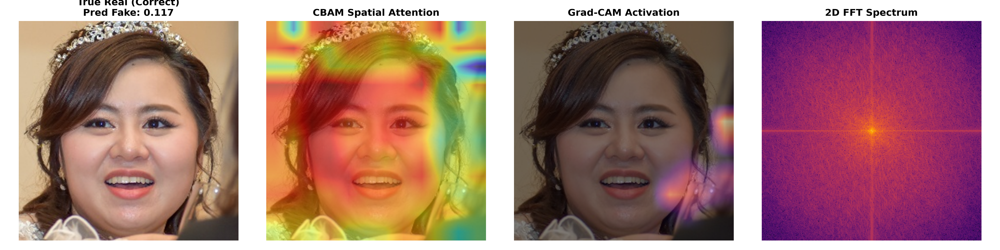

In [4]:
import glob
from IPython.display import Image, display

for img in sorted(glob.glob("/kaggle/working/benchmark_artifacts_140k/*.png")):
    display(Image(filename=img))


In [5]:
import os
import json

json_path = "/kaggle/working/benchmark_artifacts_140k/metrics_summary_140k.json"

if os.path.exists(json_path):
    with open(json_path, "r") as f:
        data = json.load(f)
    print(json.dumps(data, indent=4))
else:
    print("metrics_summary.json not found.")


{
    "Dataset": "140k Real and Fake Faces (xhlulu)",
    "Total_Images": 20000,
    "Real_Count": 10000,
    "Fake_Count": 10000,
    "Accuracy": 0.99955,
    "Precision": 0.9993003498250874,
    "Recall_TPR": 0.9998,
    "Specificity_TNR": 0.9993,
    "F1_Score": 0.9995501124718821,
    "ROC_AUC": 0.9999925299999999,
    "Average_Precision": 0.9999922615986161,
    "Equal_Error_Rate": 0.00019999999999998898,
    "EER_Threshold": 0.6132038831710815,
    "Brier_Score": 0.013906409545093208,
    "FPR_at_95_TPR": 0.0001,
    "FPR_at_99_TPR": 0.0001,
    "Confusion_Matrix": {
        "TN": 9993,
        "FP": 7,
        "FN": 2,
        "TP": 9998
    }
}


In [6]:
import os
import pandas as pd

csv_path = "/kaggle/working/benchmark_artifacts_140k/predictions_140k.csv"

if os.path.exists(csv_path):
    df = pd.read_csv(csv_path)
    display(df.head(10))
    print(f"\nTotal predictions recorded: {len(df)}")


,image_path,true_label,predicted_prob_fake,predicted_label
0,/kaggle/input/datasets/xhlulu/140k-real-and-fa...,0,0.116796,0
1,/kaggle/input/datasets/xhlulu/140k-real-and-fa...,0,0.128925,0
2,/kaggle/input/datasets/xhlulu/140k-real-and-fa...,0,0.149805,0
3,/kaggle/input/datasets/xhlulu/140k-real-and-fa...,0,0.154840,0
4,/kaggle/input/datasets/xhlulu/140k-real-and-fa...,0,0.134125,0
5,/kaggle/input/datasets/xhlulu/140k-real-and-fa...,0,0.106043,0
6,/kaggle/input/datasets/xhlulu/140k-real-and-fa...,0,0.163898,0
7,/kaggle/input/datasets/xhlulu/140k-real-and-fa...,0,0.137587,0
8,/kaggle/input/datasets/xhlulu/140k-real-and-fa...,0,0.133434,0
9,/kaggle/input/datasets/xhlulu/140k-real-and-fa...,0,0.099835,0



Total predictions recorded: 20000
